In [1]:
import pandas            as pd
import matplotlib.pyplot as plt
import numpy             as np
import seaborn           as sns
import scikitplot        as skplt
import xgboost           as xgb
import lightgbm          as lgb

from sklearn.ensemble      import RandomForestRegressor
from sklearn.ensemble      import RandomForestClassifier
from boruta                import BorutaPy
from IPython.core.display  import  HTML
from scipy                 import  stats           as ss
from sklearn               import  model_selection as ms
from sklearn               import  preprocessing   as pp
from sklearn.preprocessing import RobustScaler, MinMaxScaler, LabelEncoder
from sklearn               import  ensemble        as en

from xgboost          import XGBClassifier
from sklearn.metrics  import precision_score
from sklearn          import neighbors        as nh
from sklearn          import  preprocessing   as pp
from sklearn          import  model_selection as ms
from sklearn          import  ensemble        as en
from sklearn.ensemble import RandomForestClassifier
from sklearn          import linear_model     as lm
from sklearn.metrics  import accuracy_score, confusion_matrix, classification_report

# Helper Functions

In [2]:
def frequency_table(data:pd.DataFrame, col:str, column:str):
    freq_table = pd.crosstab(index=data[col], columns=data[column],          margins=True)
    rel_table = round(freq_table/freq_table.loc["All"], 2)
    return freq_table, rel_table


def jupyter_settings():
    %matplotlib inline
    %pylab inline
    
    plt.style.use( 'bmh' )
    plt.rcParams['figure.figsize'] = [25, 12]
    plt.rcParams['font.size'] = 24
    
    display( HTML( '<style>.container { width:100% !important; }</style>') )
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option( 'display.expand_frame_repr', False )
    
    sns.set()
    
def cramer_v( x, y ):
    cm = pd.crosstab( x, y ).values
    n = cm.sum()
    r, k = cm.shape
    
    chi2 = ss.chi2_contingency( cm )[0]
    chi2corr = max( 0, chi2 - (k-1)*(r-1)/(n-1) )
    
    kcorr = k - (k-1)**2/(n-1)
    rcorr = r - (r-1)**2/(n-1)
    
    return np.sqrt( (chi2corr/n) / ( min( kcorr-1, rcorr-1 ) ) )



def precision_at_k(x_val,y_val,model, k =2000):
    data = x_val.copy()
    k1 = data.shape[0]
    k2 =k*k1
    k2 = int(round(k2,0))
    data['response'] = y_val.copy()
    data['score']    = model[:,1].tolist()
    data = data.sort_values('score', ascending = False)
    
    data = data.reset_index(drop = True)

    data['ranking'] = data.index + 1 

    #precision top k
    data['precision_at_k'] = data['response'].cumsum()/data['ranking']
    
    return data.loc[k2 ,'precision_at_k']

def recall_at_k(x_val,y_val,model, k =2000):
    
    data1 = x_val.copy()
    k1 = data1.shape[0]
    k2 =k*k1
    k2 = int(round(k2,0))
    data1['response'] = y_val.copy()
    data1['score']    = model[:,1].tolist()
    data1 = data1.sort_values('score', ascending = False)
    
    data1 = data1.reset_index(drop = True)

    data1['ranking'] = data1.index + 1 
    #precision top k
    data1['recall_at_k'] = data1['response'].cumsum()/data1['response'].sum()
    
    return data1.loc[k2 ,'recall_at_k']

def crossvalidation(num_folds,model_name,model, x_train_f, y_train_f):
    kfold = ms.StratifiedKFold(n_splits = num_folds,shuffle = True, random_state = 42)
    precision_list = []
    recall_list = []
    f1_list = []
    cross_model = pd.DataFrame()
    i=1
    
    for train_cv,val_cv in kfold.split(x_train_f,y_train_f):
        x_train_fold = x_train_f.iloc[train_cv]
        y_train_fold = y_train_f.iloc[train_cv]
        
        x_val_fold = x_train_f.iloc[val_cv]
        y_val_fold = y_train_f.iloc[val_cv]
        
        model_fit = model.fit(x_train_fold,y_train_fold)
        
        
        yhat_model = model_fit.predict_proba(x_val_fold)
        
        precision = round(precision_at_k(x_val_fold, y_val_fold,yhat_model,0.2),3)
        recall = round(recall_at_k(x_val_fold, y_val_fold,yhat_model,0.2),3)
        f1 = round(2*(precision*recall)/(precision + recall),3)
        
        precision_list.append(precision)
        recall_list.append(recall)
        f1_list.append(f1)
        
        i +=1
    
    return pd.DataFrame({'Model': model_name,
                         'precision' :np.round(np.mean(precision_list),4).astype(str) + '+/-' + np.round(np.std(precision_list),4).astype(str),
                         'recall' : np.round(np.mean(recall_list),4).astype(str)    + '+/-' + np.round(np.std(recall_list),4).astype(str),
                         'f1_str' : np.round(np.mean(f1_list),4).astype(str)        +  '+/-'+ np.round(np.std(f1_list),4).astype(str)}, index = [0])
    
   

In [3]:
jupyter_settings()

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


# 0.1 Data Colection

In [4]:
df_raw = pd.read_csv('/home/mattheus/Processo DataRISK/case_datarisk/treino.csv')
df_raw.head()

,inadimplente,util_linhas_inseguras,idade,vezes_passou_de_30_59_dias,razao_debito,salario_mensal,numero_linhas_crdto_aberto,numero_vezes_passou_90_dias,numero_emprestimos_imobiliarios,numero_de_vezes_que_passou_60_89_dias,numero_de_dependentes
0,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0


# 1.0 Data dimension

In [5]:
df1 = df_raw.copy()

In [6]:
print(f'Número de linhas é:{df1.shape[0]}')
print(f'Número de colunas é:{df1.shape[1]}')

Número de linhas é:110000
Número de colunas é:11


# 1.1 Data types

In [7]:
df1.dtypes

inadimplente                               int64
util_linhas_inseguras                    float64
idade                                      int64
vezes_passou_de_30_59_dias                 int64
razao_debito                             float64
salario_mensal                           float64
numero_linhas_crdto_aberto                 int64
numero_vezes_passou_90_dias                int64
numero_emprestimos_imobiliarios            int64
numero_de_vezes_que_passou_60_89_dias      int64
numero_de_dependentes                    float64
dtype: object

# 1.2 Data NAs

In [8]:
df_na = pd.DataFrame({'NAs': df1.isna().sum(),'% de NAs':df1.isna().sum()/110000})
df_na

,NAs,% de NAs
inadimplente,0,0.000000
util_linhas_inseguras,0,0.000000
idade,0,0.000000
vezes_passou_de_30_59_dias,0,0.000000
razao_debito,0,0.000000
salario_mensal,21763,0.197845
numero_linhas_crdto_aberto,0,0.000000
numero_vezes_passou_90_dias,0,0.000000
numero_emprestimos_imobiliarios,0,0.000000
numero_de_vezes_que_passou_60_89_dias,0,0.000000


# 1.3 Data Descriptive

In [9]:
df1.columns

Index(['inadimplente', 'util_linhas_inseguras', 'idade',
       'vezes_passou_de_30_59_dias', 'razao_debito', 'salario_mensal',
       'numero_linhas_crdto_aberto', 'numero_vezes_passou_90_dias',
       'numero_emprestimos_imobiliarios',
       'numero_de_vezes_que_passou_60_89_dias', 'numero_de_dependentes'],
      dtype='object')

# 1.3.1 Num Attributes

In [10]:
num_attributes = df1.drop(columns = ('inadimplente'), axis = 1)
num_attributes.head()

,util_linhas_inseguras,idade,vezes_passou_de_30_59_dias,razao_debito,salario_mensal,numero_linhas_crdto_aberto,numero_vezes_passou_90_dias,numero_emprestimos_imobiliarios,numero_de_vezes_que_passou_60_89_dias,numero_de_dependentes
0,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0


In [11]:
c1 = pd.DataFrame(num_attributes.apply(np.mean))
c2 = pd.DataFrame(num_attributes.apply(np.median))
c3 = pd.DataFrame(num_attributes.apply(np.max))
c4 = pd.DataFrame(num_attributes.apply(np.min))
c5 = pd.DataFrame(num_attributes.apply(lambda x : x.max() - x.min()))
c6 = pd.DataFrame(num_attributes.apply(lambda x: x.skew()))
c7 = pd.DataFrame(num_attributes.apply(lambda x: x.kurtosis()))

a1 = pd.concat([c1,c2,c3,c4,c5,c6,c7], axis = 1)
a1.columns = ['média','mediana','máximo','minimo','range','skew','kurtosis']

In [12]:
a1

,média,mediana,máximo,minimo,range,skew,kurtosis
util_linhas_inseguras,5.929979,0.155936,50708.0,0.0,50708.0,109.363239,17653.519208
idade,52.255636,52.000000,109.0,0.0,109.0,0.187683,-0.497250
vezes_passou_de_30_59_dias,0.424055,0.000000,98.0,0.0,98.0,22.358208,510.931290
razao_debito,354.823589,0.366682,329664.0,0.0,329664.0,92.913075,13094.884586
salario_mensal,6637.411063,NaN,3008750.0,0.0,3008750.0,140.701543,29432.520949
numero_linhas_crdto_aberto,8.445573,8.000000,58.0,0.0,58.0,1.198544,3.009576
numero_vezes_passou_90_dias,0.269955,0.000000,98.0,0.0,98.0,22.837191,525.789190
numero_emprestimos_imobiliarios,1.019891,1.000000,54.0,0.0,54.0,3.790920,73.539832
numero_de_vezes_que_passou_60_89_dias,0.243891,0.000000,98.0,0.0,98.0,23.062550,533.011147
numero_de_dependentes,0.757482,NaN,20.0,0.0,20.0,1.591441,3.104324


<AxesSubplot: >

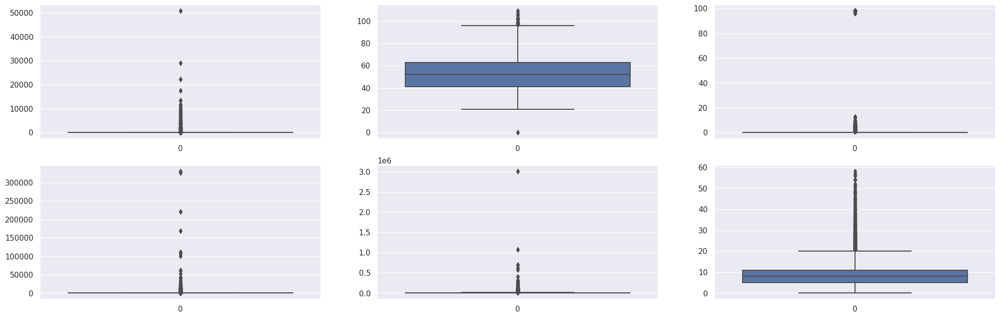

In [13]:
plt.subplot(3,3,1)
#uti_linhas_seguras
sns.boxplot(df1['util_linhas_inseguras'])
plt.subplot(3,3,2)
#idade
sns.boxplot(df1['idade'])
#vezes_passou_de_30_59_dias	
plt.subplot(3,3,3)
sns.boxplot(df1['vezes_passou_de_30_59_dias'])
#razao_debito
plt.subplot(3,3,4)
sns.boxplot(df1['razao_debito'])
#salario_mensal
plt.subplot(3,3,5)
sns.boxplot(df1['salario_mensal'])
#numero_linhas_crdto_aberto	
plt.subplot(3,3,6)
sns.boxplot(df1['numero_linhas_crdto_aberto'])


<AxesSubplot: >

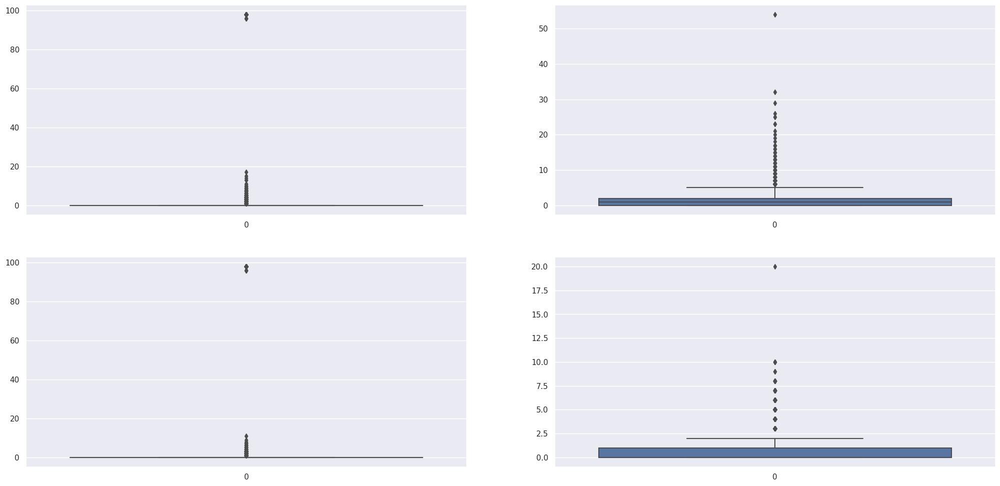

In [14]:
#numero_vezes_passou_90_dias
plt.subplot(2,2,1)
sns.boxplot(df1['numero_vezes_passou_90_dias'])
#numero_emprestimos_imobiliarios	
plt.subplot(2,2,2)
sns.boxplot(df1['numero_emprestimos_imobiliarios'])
#numero_de_vezes_que_passou_60_89_dias	
plt.subplot(2,2,3)
sns.boxplot(df1['numero_de_vezes_que_passou_60_89_dias'])
#numero_de_dependentes
plt.subplot(2,2,4)
sns.boxplot(df1['numero_de_dependentes'])

# 1.3.2 Cat Attributes

<AxesSubplot: xlabel='inadimplente', ylabel='count'>

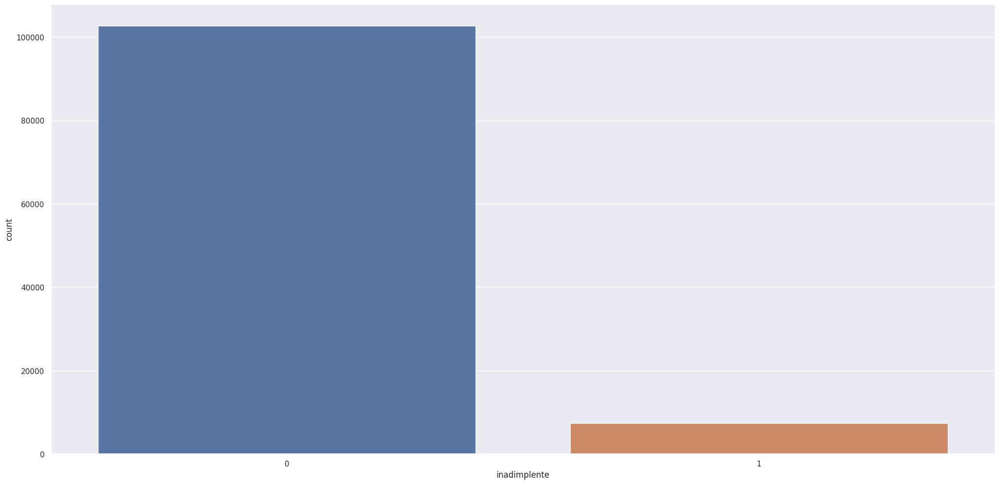

In [15]:
sns.countplot(x = 'inadimplente', data = df1)

# 1.3.3 Problems


* Dados estão desbalanceados
* Idade mínima 0
* Outliers presentes em muitas variáveis
* Numero de vezes que passou do prazo de emprestimo mt longo (98 dias)
* Vários NAs na coluna de salário
* Alguns NAs na coluna de dependentes


# 1.4 Remove NAs

In [16]:
#para esse primeiro ciclo de CRISP decidi remover os NAs sem muita análise 
df2 = df1.dropna(subset= ['salario_mensal','numero_de_dependentes'])
print(f'Antes tinha {df1.shape[0]} e agora tem {df2.shape[0]}')
print(f'Antes tinha {df1.shape[1]} e agora tem {df2.shape[1]}')

Antes tinha 110000 e agora tem 88237
Antes tinha 11 e agora tem 11


In [17]:
a = df2['numero_vezes_passou_90_dias'].unique()
b = df2['numero_de_vezes_que_passou_60_89_dias'].unique()
c = df2['vezes_passou_de_30_59_dias'].unique()
print(a)
print(b)
print(c)

#vemos que 96 e 98 parecem ser anomalias no processo e para esse primeiro momento vou excluir

[ 0  1  3  2  4 98 10  5  6  7  8  9 15 11 96 13 14 17]
[ 0  1  2  5 98  4  3  6  7  8 11  9 96]
[ 2  0  1  3  5  4  7 10  6 98 12  8  9 96 13]


In [18]:
df2['numero_de_dependentes'].value_counts()
#vemos que a partir do 9 os numeros caem demais

0.0     47963
1.0     17988
2.0     13274
3.0      6367
4.0      1958
5.0       520
6.0       110
7.0        36
8.0        15
10.0        4
20.0        1
9.0         1
Name: numero_de_dependentes, dtype: int64

In [19]:
#analisando  a razao_debito
df2[df2['razao_debito'] > 1].sort_values('razao_debito',ascending = False).head(20)

,inadimplente,util_linhas_inseguras,idade,vezes_passou_de_30_59_dias,razao_debito,salario_mensal,numero_linhas_crdto_aberto,numero_vezes_passou_90_dias,numero_emprestimos_imobiliarios,numero_de_vezes_que_passou_60_89_dias,numero_de_dependentes
53682,0,1.000000,89,0,61106.5,1.0,2,0,0,0,0.0
19361,0,0.108889,48,0,25801.0,0.0,4,0,1,0,0.0
63855,0,0.000000,66,0,25033.0,0.0,3,0,0,0,0.0
66929,1,0.063049,94,1,20809.0,0.0,13,1,0,1,0.0
25863,0,0.000000,38,0,20000.0,0.0,2,0,0,0,0.0
90,0,0.039388,51,0,15466.0,0.0,7,0,0,0,0.0
24682,1,0.962681,57,3,14969.0,0.0,15,1,8,2,3.0
18228,0,0.002335,65,0,12778.0,0.0,4,0,0,0,1.0
19557,0,0.019939,66,1,12707.0,0.0,22,0,4,0,2.0
34779,0,0.026228,50,0,12018.0,0.0,16,0,3,0,0.0


In [20]:
#analisando  a razao_debito
print(df2[df2['razao_debito'] < 1].shape[0])
print(df2[df2['razao_debito'] > 1].shape[0])
print(df2['razao_debito'].max())

82876
5344
61106.5


In [21]:
#analisando idade
df2.sort_values('idade', ascending = True).head(20)

,inadimplente,util_linhas_inseguras,idade,vezes_passou_de_30_59_dias,razao_debito,salario_mensal,numero_linhas_crdto_aberto,numero_vezes_passou_90_dias,numero_emprestimos_imobiliarios,numero_de_vezes_que_passou_60_89_dias,numero_de_dependentes
65695,0,1.000000,0,1,0.436927,6000.0,6,0,2,0,2.0
53603,1,1.000000,21,98,0.000000,1300.0,0,98,0,98,0.0
105733,0,0.538462,21,0,8.000000,1.0,1,0,0,0,0.0
61256,0,1.000000,21,0,0.000000,1921.0,2,0,0,0,0.0
89331,0,1.000000,21,0,0.000000,1000.0,1,0,0,0,0.0
61450,0,1.000000,21,0,1.500000,1.0,1,0,0,0,0.0
4417,0,1.000000,21,98,0.000000,0.0,0,98,0,98,0.0
38544,0,0.063936,21,0,0.000519,1925.0,1,0,0,0,0.0
76664,0,0.347652,21,0,0.012484,800.0,1,0,0,0,0.0
107622,0,1.000000,21,0,0.000000,0.0,1,0,0,0,0.0


In [22]:
#uti_linhas_inseguras
a = df2[df2['util_linhas_inseguras'] < 100]
a.shape[0]

88115

In [23]:
b = df2[df2['util_linhas_inseguras'] > 100]
b.sort_values('util_linhas_inseguras', ascending = False)
#não entendi muito bem do que se trata essa feature logo não vou mexer nela

,inadimplente,util_linhas_inseguras,idade,vezes_passou_de_30_59_dias,razao_debito,salario_mensal,numero_linhas_crdto_aberto,numero_vezes_passou_90_dias,numero_emprestimos_imobiliarios,numero_de_vezes_que_passou_60_89_dias,numero_de_dependentes
85489,0,50708.000000,55,0,0.221757,38000.0,7,0,2,0,0.0
31414,0,29110.000000,58,0,0.402560,10000.0,7,0,1,0,0.0
21978,0,17441.000000,51,1,0.354072,14770.0,14,0,2,0,0.0
72592,0,13498.000000,38,0,0.347428,4800.0,6,0,1,0,2.0
71705,0,13400.000000,43,0,0.995801,5000.0,11,0,1,0,1.0
58852,0,11843.000000,45,1,0.331641,10833.0,5,0,2,0,2.0
13669,0,10209.000000,65,0,0.268667,12133.0,6,0,3,0,0.0
50695,0,9684.000000,45,1,0.423414,9583.0,6,0,2,0,1.0
8199,0,9340.000000,62,0,0.186908,8233.0,2,0,1,0,3.0
60021,0,9193.000000,50,0,0.324747,7608.0,5,0,2,0,3.0


In [24]:
df_clean = df2[df2['idade']> 0]
df_clean = df_clean[(df_clean['numero_vezes_passou_90_dias'] != 98) & (df_clean['numero_vezes_passou_90_dias'] != 96)]
df_clean = df_clean[df_clean['numero_de_dependentes'] != 20]
df_clean.shape[0]

88120

# 2.0 Feature Engineering

In [25]:
df3 = df_clean.copy()

In [26]:
df3['idade_cat'] = df3['idade'].apply(lambda x : 'adulto' if x < 40 else 'coroa' if x < 65 else 'idoso')

df3['salario_mensal_cat'] = df3['salario_mensal'].apply(lambda x: 'classe_baixa' if x <= 3000 else 'classe_media' if x<=10000 else 'classe_alta' )

df3['renda_por_dependente'] = df3.apply(lambda x: x['salario_mensal']/x['numero_de_dependentes'] if x['numero_de_dependentes'] != 0 else x['salario_mensal'], axis = 1)

df3['atraso_pagamento'] = df3.apply(lambda x: 0 if (x['vezes_passou_de_30_59_dias'] == 0) & (x['numero_vezes_passou_90_dias'] == 0) & (x['numero_de_vezes_que_passou_60_89_dias'] == 0) else 1, axis = 1)

df3['dívidas_acima_patrimonio'] = df3['razao_debito'].apply(lambda x: 1 if x >= 1 else 0 )

In [27]:
df3.head()

,inadimplente,util_linhas_inseguras,idade,vezes_passou_de_30_59_dias,razao_debito,salario_mensal,numero_linhas_crdto_aberto,numero_vezes_passou_90_dias,numero_emprestimos_imobiliarios,numero_de_vezes_que_passou_60_89_dias,numero_de_dependentes,idade_cat,salario_mensal_cat,renda_por_dependente,atraso_pagamento,dívidas_acima_patrimonio
0,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0,coroa,classe_media,4560.0,1,0
1,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0,coroa,classe_baixa,2600.0,0,0
2,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0,adulto,classe_media,3042.0,1,0
3,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0,adulto,classe_media,3300.0,0,0
4,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0,coroa,classe_alta,63588.0,1,0


# 3.0 EDA

In [28]:
df4 = df3.copy()

* h1 Quem atrasou tem mais chances de ser inadimplente
* h2 quem ganha menos tem mais chance de ser inadimplente
* h3 quem é mais novo tem mais chance de ser inadimplente
* h4 quem tem muitos dependentes tem mais chances de ser inadimplente
* h5 quanto maior a razao_debito mais chances de ser inadimplente

# 3.1 Análise Univariada

# 3.1.1 Cat Variables

<AxesSubplot: xlabel='atraso_pagamento', ylabel='count'>

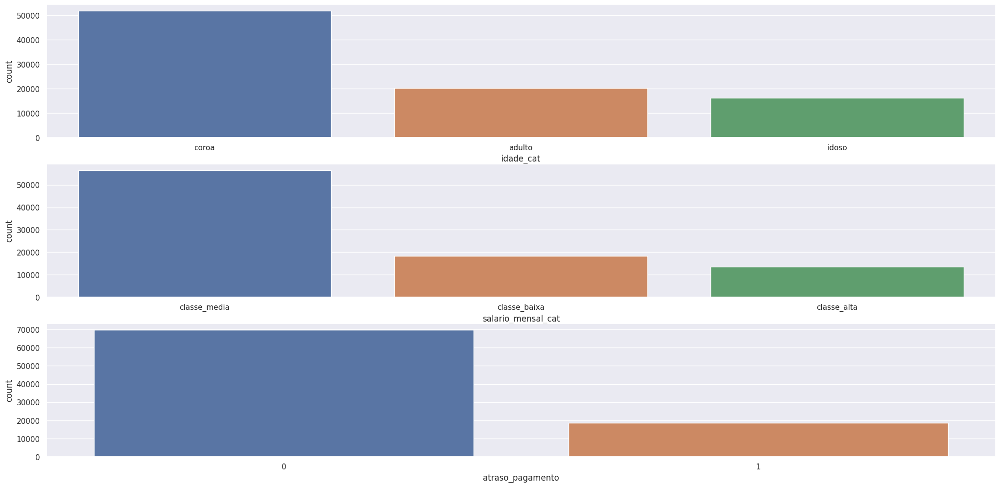

In [29]:
plt.subplot(3,1,1)
sns.countplot(x='idade_cat', data = df4)
plt.subplot(3,1,2)
sns.countplot(x='salario_mensal_cat', data = df4)
plt.subplot(3,1,3)
sns.countplot(x='atraso_pagamento', data = df4)

# 3.2 Analise Bivariada

# Hipótese 01 - Quem atrasou tem mais chances de ser inadimplente
**Verdadeiro** Proporcionalmente quem atrasa pagamento tem mais chances de se tornar inadimplente. 22% dos que atrasam são inadimplentes enquanto 3% dos que não atrasam são inadimplentes

In [30]:
#Hipótese 01 - quem atrasou tem mais chances de ser inadimplente
a,b = frequency_table(df4,'inadimplente','atraso_pagamento')
print(a)
print('-----------------------------------------------')
print(b)

atraso_pagamento      0      1    All
inadimplente                         
0                 67560  14539  82099
1                  2042   3979   6021
All               69602  18518  88120
-----------------------------------------------
atraso_pagamento     0     1   All
inadimplente                      
0                 0.97  0.79  0.93
1                 0.03  0.21  0.07
All               1.00  1.00  1.00


<AxesSubplot: xlabel='atraso_pagamento', ylabel='count'>

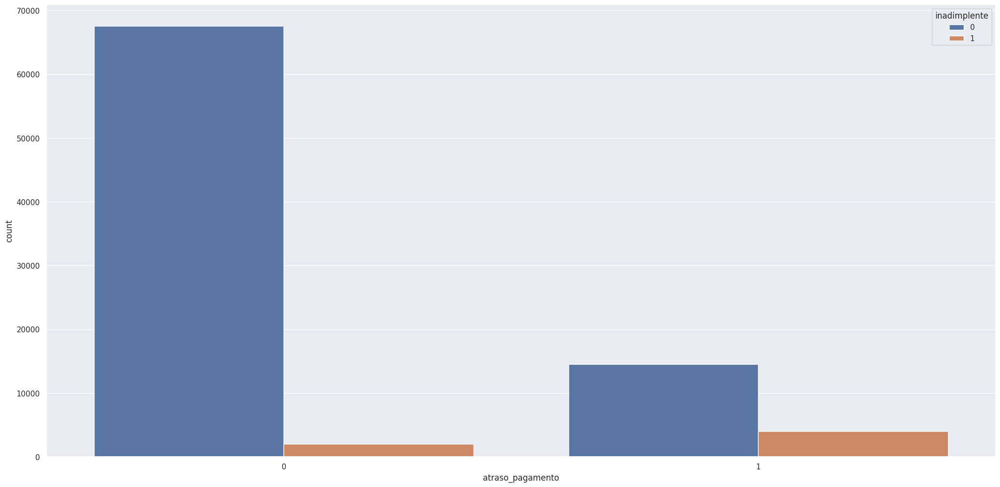

In [31]:
sns.countplot(x = df4['atraso_pagamento'], hue = df4['inadimplente'])

** vemos claramente que a proporção de inadimplentes em quem atrasa pagamento é maior

# Hipótese 02 - Quem tem menor salário tem mais chances de ser inadimplente
**Falso** Classe baixa não é a mais inadimplente e sim a classe média

In [32]:
df4['salario_mensal_cat'].value_counts(normalize = True)

classe_media    0.639843
classe_baixa    0.207410
classe_alta     0.152746
Name: salario_mensal_cat, dtype: float64

/tmp/ipykernel_5247/554788468.py:12: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(aux10.corr(method = 'pearson'), annot = True);


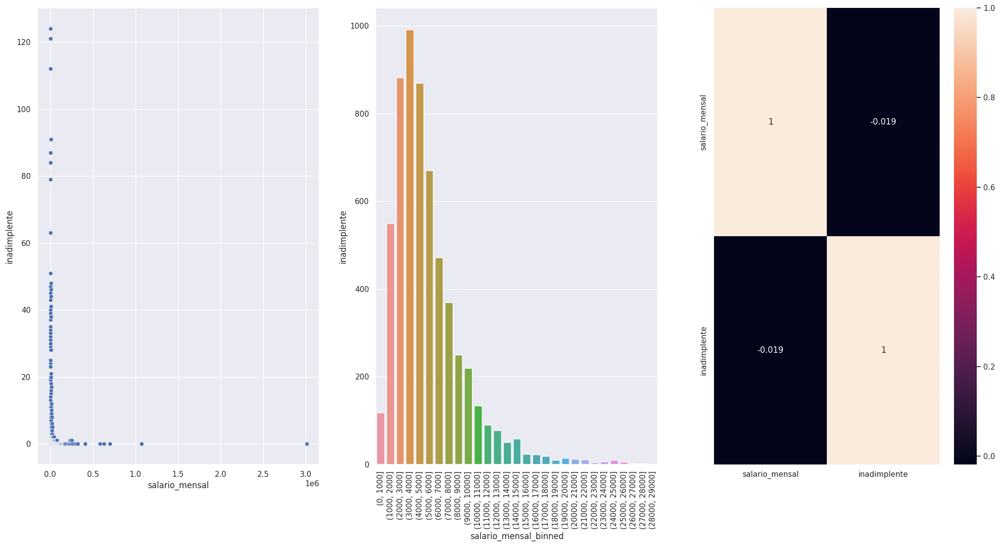

In [33]:
aux10 = df4[['salario_mensal','inadimplente']].groupby('salario_mensal').sum().reset_index()
plt.subplot(1,3,1)
sns.scatterplot(x = 'salario_mensal', y='inadimplente', data = aux10);
plt.subplot(1,3,2)
bins = list(np.arange(0,30000,1000))
aux10['salario_mensal_binned'] = pd.cut(aux10['salario_mensal'], bins = bins )
aux20 = aux10[['salario_mensal_binned','inadimplente']].groupby('salario_mensal_binned').sum().reset_index()

sns.barplot(x = 'salario_mensal_binned', y = 'inadimplente', data = aux20);
plt.xticks(rotation = 90);
plt.subplot(1,3,3)
sns.heatmap(aux10.corr(method = 'pearson'), annot = True);


/tmp/ipykernel_5247/3816611370.py:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df4[df4['salario_mensal_cat']=='classe_baixa']['inadimplente'],label = 'classe_baixa',shade = True, color = 'Green')
/tmp/ipykernel_5247/3816611370.py:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df4[df4['salario_mensal_cat']=='classe_media']['inadimplente'],label = 'classe_media',shade = True, color = 'Blue')
/tmp/ipykernel_5247/3816611370.py:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df4[df4['salario_mensal_cat']=='classe_alta']['inadimplente'],label = 'classe_alta',shade = True, color = 'Orange')


<AxesSubplot: xlabel='salario_mensal_cat', ylabel='inadimplente'>

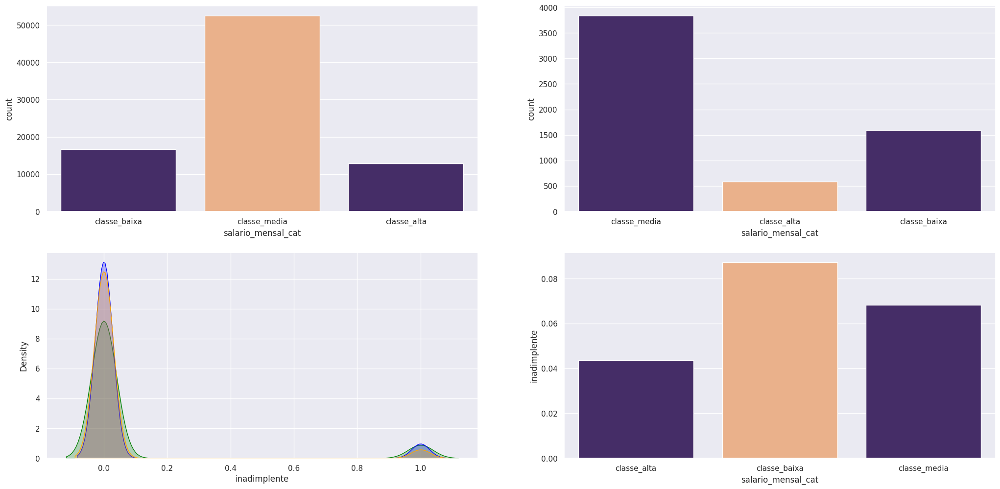

In [34]:

plt.subplot(2,2,1)
aux1 = df4[df4['inadimplente'] == 0]
sns.countplot(data = aux1 , x = 'salario_mensal_cat', palette=['#432371',"#FAAE7B"])
plt.subplot(2,2,2)
aux2 = df4[df4['inadimplente'] == 1]
sns.countplot(x = 'salario_mensal_cat', data = aux2, palette=['#432371',"#FAAE7B"])
plt.subplot(2,2,3)
sns.kdeplot(df4[df4['salario_mensal_cat']=='classe_baixa']['inadimplente'],label = 'classe_baixa',shade = True, color = 'Green')
sns.kdeplot(df4[df4['salario_mensal_cat']=='classe_media']['inadimplente'],label = 'classe_media',shade = True, color = 'Blue')
sns.kdeplot(df4[df4['salario_mensal_cat']=='classe_alta']['inadimplente'],label = 'classe_alta',shade = True, color = 'Orange')
plt.subplot(2,2,4)
a = df4[['salario_mensal_cat','inadimplente']].groupby('salario_mensal_cat').mean().reset_index()
sns.barplot(x = 'salario_mensal_cat',y = 'inadimplente', data = a, palette=['#432371',"#FAAE7B"])

# Hipótese 03 - Quem é mais novo tem mais chance de ser inadimplente
**Verdadeiro** Proporcionalmente o adulto tem mais chance de ser inadimplente que os demais

In [35]:
df4['idade_cat'].value_counts(normalize = True)

coroa     0.587392
adulto    0.228700
idoso     0.183908
Name: idade_cat, dtype: float64

<AxesSubplot: xlabel='idade_cat', ylabel='inadimplente'>

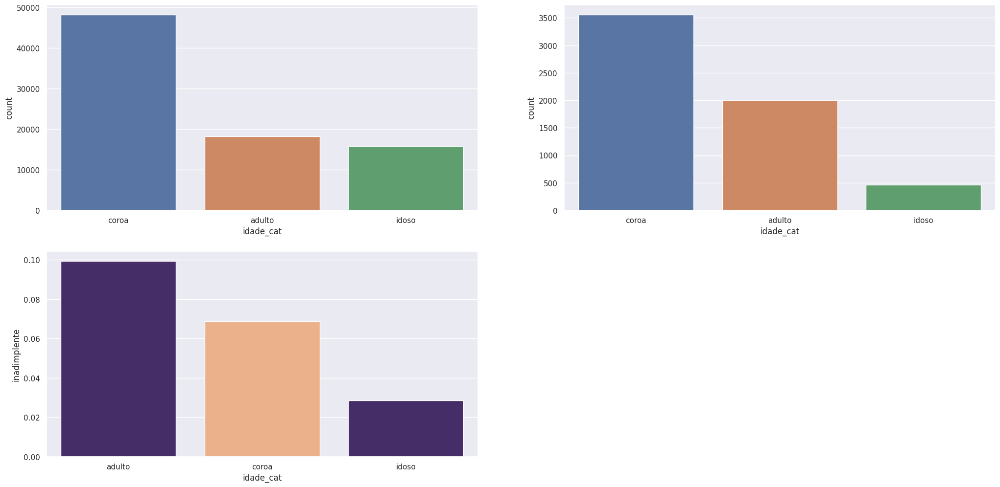

In [36]:
plt.subplot(2,2,1)
aux3 = df4[df4['inadimplente'] == 0]
sns.countplot(x = 'idade_cat', data = aux3)
plt.subplot(2,2,2)
aux4 = df4[df4['inadimplente'] == 1]
sns.countplot(x = 'idade_cat', data = aux4)
plt.subplot(2,2,3)
b = df4[['idade_cat','inadimplente']].groupby('idade_cat').mean().reset_index()
sns.barplot(x = 'idade_cat',y = 'inadimplente', data = b, palette=['#432371',"#FAAE7B"])




# Hipótese 04 - Quem tem muitos dependentes tem mais chances de ser inadimplente
**Verdadeiro** Removendo os outliers, quanto mais dependentes mais chances de ser inadimplente

In [37]:
df4['numero_de_dependentes'].value_counts()

0.0     47883
1.0     17972
2.0     13258
3.0      6365
4.0      1957
5.0       519
6.0       110
7.0        36
8.0        15
10.0        4
9.0         1
Name: numero_de_dependentes, dtype: int64

In [38]:
df_aux = df4[df4['numero_de_dependentes'] < 9]
aux11 = df_aux[['numero_de_dependentes','inadimplente']].groupby('numero_de_dependentes').mean().reset_index()
aux11.sort_values('inadimplente', ascending = False)

,numero_de_dependentes,inadimplente
6,6.0,0.136364
4,4.0,0.104241
5,5.0,0.090559
3,3.0,0.086724
7,7.0,0.083333
2,2.0,0.080932
1,1.0,0.072279
8,8.0,0.066667
0,0.0,0.059040


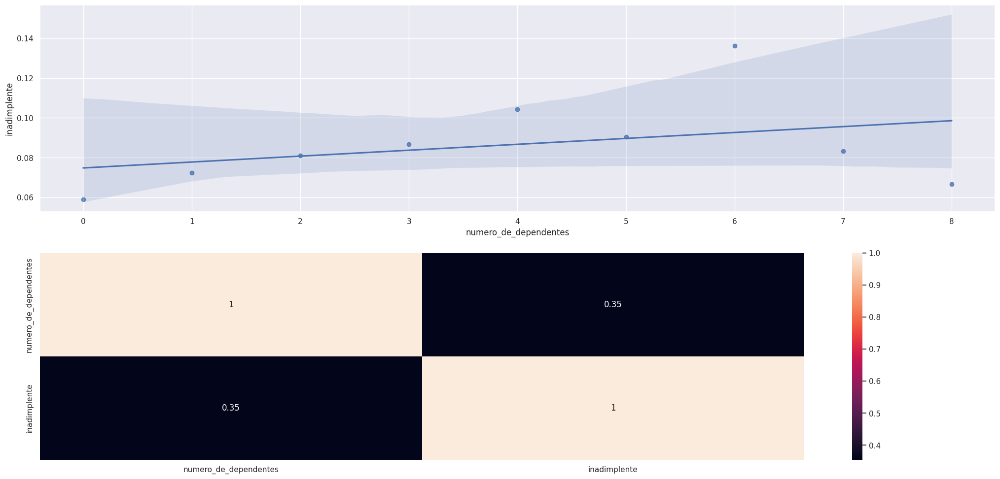

In [39]:
plt.subplot(2,1,1)
sns.regplot( x='numero_de_dependentes', y='inadimplente', data=aux11 );
plt.subplot(2,1,2)
sns.heatmap( aux11.corr( method='pearson' ), annot=True );

# Hipótese 05 - Quanto mais emprestimos mais chances de ser inadimplentes 
**Inconclusivo** 

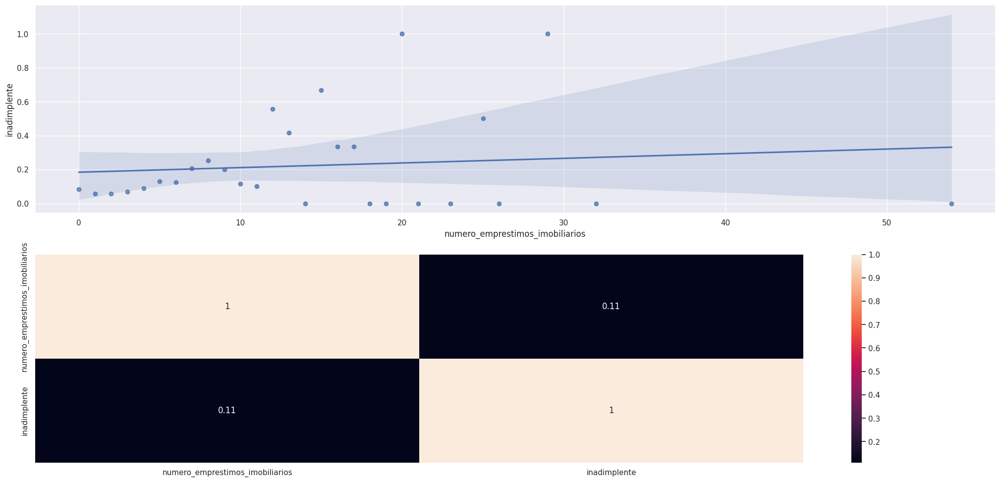

In [40]:
plt.subplot(2,1,1)
aux22 = df4[['numero_emprestimos_imobiliarios','inadimplente']].groupby('numero_emprestimos_imobiliarios').mean().reset_index()
sns.regplot( x='numero_emprestimos_imobiliarios', y='inadimplente', data=aux22 );
plt.subplot(2,1,2)
sns.heatmap( aux22.corr( method='pearson' ), annot=True );


# 3.3 Análise multivariada

# 3.3.1 Correlação dos numéricos

<AxesSubplot: >

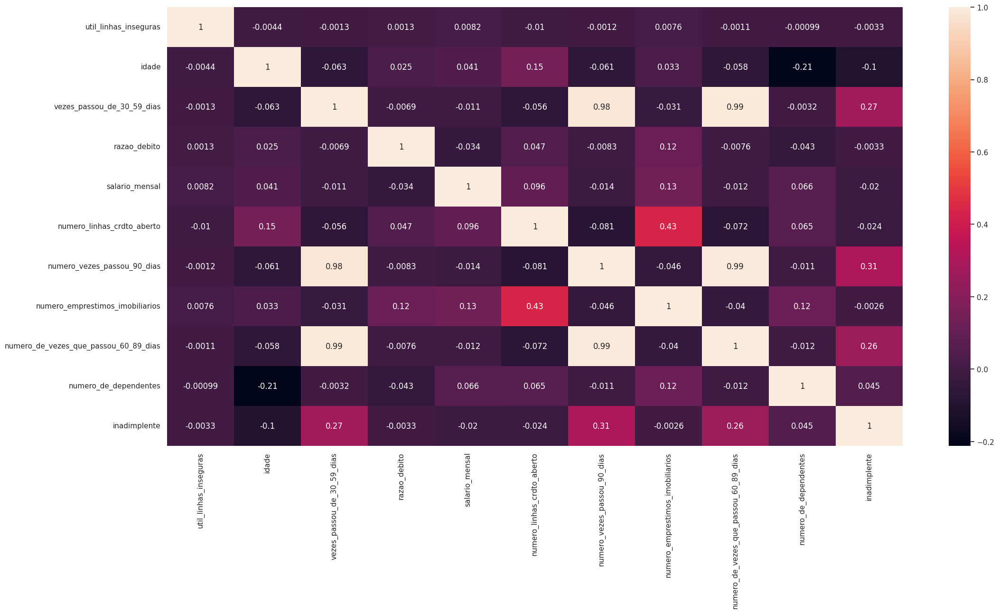

In [41]:
num_attributes['inadimplente'] = df4['inadimplente']
correlation = num_attributes.corr(method = 'pearson')
sns.heatmap(correlation, annot = True)

# 3.4.1 Correlação das categóricas

<AxesSubplot: >

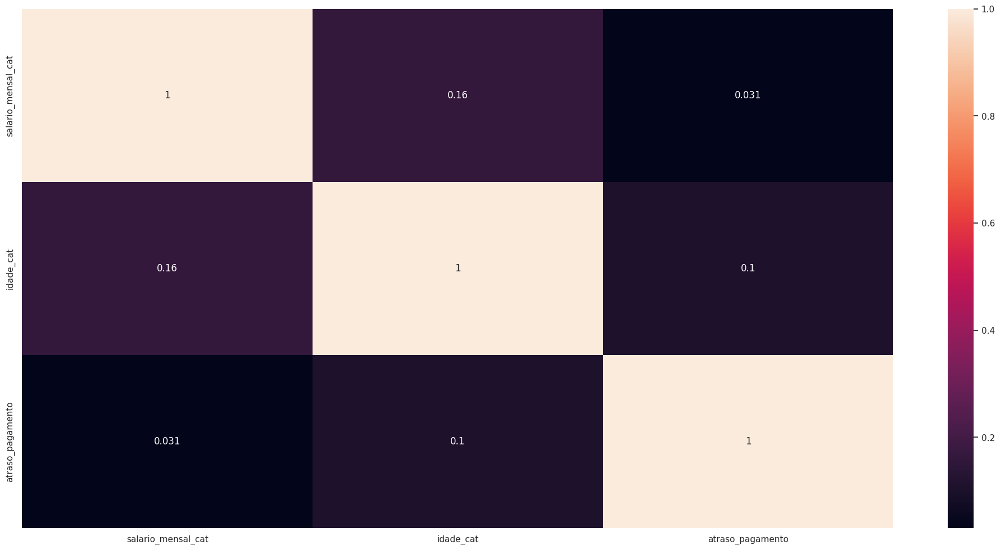

In [42]:
# only categorical data
a = df3[['salario_mensal_cat','idade_cat','atraso_pagamento']]

# Calculate cramer V
a1 = cramer_v( a['salario_mensal_cat'], a['salario_mensal_cat'] )
a2 = cramer_v( a['salario_mensal_cat'], a['idade_cat'] )
a3 = cramer_v( a['salario_mensal_cat'], a['atraso_pagamento'] )




b1 = cramer_v( a['idade_cat'], a['salario_mensal_cat'] )
b2 = cramer_v( a['idade_cat'], a['idade_cat'] )
b3 = cramer_v( a['idade_cat'], a['atraso_pagamento'] )


c1 = cramer_v( a['atraso_pagamento'], a['salario_mensal_cat'] )
c2 = cramer_v( a['atraso_pagamento'], a['idade_cat'] )
c3 = cramer_v( a['atraso_pagamento'], a['atraso_pagamento'] )





# Final dataset
d = pd.DataFrame( {'salario_mensal_cat': [a1, a2, a3], 
               'idade_cat': [b1, b2, b3],
               'atraso_pagamento': [c1, c2, c3]})
d = d.set_index( d.columns )

sns.heatmap( d, annot=True )

# 3.5 Hypothesis conclusion

In [43]:
hip = pd.DataFrame({'Hipotese':'H1 - Quem atrasou tem mais chances de ser inadimplente','True/False':'True','Relevância':'High'}, index=[0])
hip2 = pd.DataFrame({'Hipotese':'H2 - Quem tem menor salário tem mais chances de ser inadimplente','True/False':'False','Relevância':'Medium'}, index=[0])
hip3 = pd.DataFrame({'Hipotese':'H3 - Quem é mais novo tem mais chance de ser inadimplente','True/False':'True','Relevância':'High'}, index=[0])
hip4 = pd.DataFrame({'Hipotese':'H4 - Quem tem muitos dependentes tem mais chances de ser inadimplente','True/False':'True','Relevância':'Medium'}, index=[0])
hip5 = pd.DataFrame({'Hipotese':'H5 - quanto mais empréstimos mais chances de ser inadimplentes','True/False':'False','Relevância':'Low'}, index=[0])


pd.set_option('display.max_colwidth',120)
hip_final = pd.concat([hip,hip2,hip3,hip4,hip5], axis = 0)
hip_final

,Hipotese,True/False,Relevância
0,H1 - Quem atrasou tem mais chances de ser inadimplente,True,High
0,H2 - Quem tem menor salário tem mais chances de ser inadimplente,False,Medium
0,H3 - Quem é mais novo tem mais chance de ser inadimplente,True,High
0,H4 - Quem tem muitos dependentes tem mais chances de ser inadimplente,True,Medium
0,H5 - quanto mais empréstimos mais chances de ser inadimplentes,False,Low


# 4.0 Data Preparation

In [44]:
df5 = df4.copy()
X = df5.drop('inadimplente', axis = 1)
y = df5['inadimplente'].copy()

x_train, x_validation,y_train,y_validation = ms.train_test_split(X,y,test_size = 0.3,random_state=42)
df6 = pd.concat([x_train,y_train], axis = 1)

In [45]:
print(X.shape[0])
print(x_train.shape[0])
print(x_validation.shape[0])

88120
61684
26436


In [46]:
df6.head()

,util_linhas_inseguras,idade,vezes_passou_de_30_59_dias,razao_debito,salario_mensal,numero_linhas_crdto_aberto,numero_vezes_passou_90_dias,numero_emprestimos_imobiliarios,numero_de_vezes_que_passou_60_89_dias,numero_de_dependentes,idade_cat,salario_mensal_cat,renda_por_dependente,atraso_pagamento,dívidas_acima_patrimonio,inadimplente
5689,0.530343,37,0,0.365736,2900.0,6,0,1,0,1.0,adulto,classe_baixa,2900.0,0,0,1
44595,0.035721,56,0,0.233260,12200.0,14,0,1,0,1.0,coroa,classe_alta,12200.0,0,0,0
9502,0.030298,37,0,0.314575,3944.0,7,0,1,0,1.0,adulto,classe_media,3944.0,0,0,0
18893,0.239039,50,0,0.423205,9583.0,16,0,2,0,2.0,coroa,classe_media,4791.5,0,0,0
89552,0.112508,49,0,0.782496,8900.0,9,0,3,0,0.0,coroa,classe_media,8900.0,0,0,0


# 4.1 Standartization

In [47]:
ss = pp.StandardScaler()
df6['idade'] = ss.fit_transform(df6[['idade']].values)

# 4.2 Rescaling

In [48]:
rs = RobustScaler()
mms = MinMaxScaler()
#util_linhas_inseguras
df6['util_linhas_inseguras'] = rs.fit_transform(df6[['util_linhas_inseguras']])
#vezes_passou_de_30_59_dias
df6['vezes_passou_de_30_59_dias'] = rs.fit_transform(df6[['vezes_passou_de_30_59_dias']])
#razao_debito
df6['razao_debito'] = rs.fit_transform(df6[['razao_debito']])
#salario_mensal
df6['salario_mensal'] = rs.fit_transform(df6[['salario_mensal']])
#numero_linhas_crdto_aberto
df6['numero_linhas_crdto_aberto'] = mms.fit_transform(df6[['numero_linhas_crdto_aberto']])
#numero_vezes_passou_90_dias
df6['numero_vezes_passou_90_dias'] = rs.fit_transform(df6[['numero_vezes_passou_90_dias']])
#numero_emprestimos_imobiliarios
df6['numero_emprestimos_imobiliarios'] = rs.fit_transform(df6[['numero_emprestimos_imobiliarios']])
#numero_de_vezes_que_passou_60_89_dias
df6['numero_de_vezes_que_passou_60_89_dias'] = rs.fit_transform(df6[['numero_de_vezes_que_passou_60_89_dias']])
#numero_de_dependentes
df6['numero_de_dependentes'] = mms.fit_transform(df6[['numero_de_dependentes']])
#renda_por_dependente
df6['renda_por_dependente'] = rs.fit_transform(df6[['renda_por_dependente']])

# 4.3 Encoding

In [49]:
#idade_cat
df6 = pd.get_dummies(df6,prefix = 'idade_cat', columns = ['idade_cat'])
#salario_mensal_cat
df6 = pd.get_dummies(df6,prefix = 'salario_mensal_cat', columns = ['salario_mensal_cat'])


# 4.4 Validation Preparation

In [50]:
x_validation['idade'] = ss.transform(x_validation[['idade']].values)
#util_linhas_inseguras
x_validation['util_linhas_inseguras'] = rs.transform(x_validation[['util_linhas_inseguras']])
#vezes_passou_de_30_59_dias
x_validation['vezes_passou_de_30_59_dias'] = rs.transform(x_validation[['vezes_passou_de_30_59_dias']])
#razao_debito
x_validation['razao_debito'] = rs.transform(x_validation[['razao_debito']])
#salario_mensal
x_validation['salario_mensal'] = rs.transform(x_validation[['salario_mensal']])
#numero_linhas_crdto_aberto
x_validation['numero_linhas_crdto_aberto'] = mms.transform(x_validation[['numero_linhas_crdto_aberto']])
#numero_vezes_passou_90_dias
x_validation['numero_vezes_passou_90_dias'] = rs.transform(x_validation[['numero_vezes_passou_90_dias']])
#numero_emprestimos_imobiliarios
x_validation['numero_emprestimos_imobiliarios'] = rs.transform(x_validation[['numero_emprestimos_imobiliarios']])
#numero_de_vezes_que_passou_60_89_dias
x_validation['numero_de_vezes_que_passou_60_89_dias'] = rs.transform(x_validation[['numero_de_vezes_que_passou_60_89_dias']])
#numero_de_dependentes
x_validation['numero_de_dependentes'] = mms.transform(x_validation[['numero_de_dependentes']])
#renda_por_dependente
x_validation['renda_por_dependente'] = rs.transform(x_validation[['renda_por_dependente']])

#idade_cat
x_validation = pd.get_dummies(x_validation,prefix = 'idade_cat', columns = ['idade_cat'])
#salario_mensal_cat
x_validation = pd.get_dummies(x_validation,prefix = 'salario_mensal_cat', columns = ['salario_mensal_cat'])

/home/mattheus/.pyenv/versions/3.11.0/envs/rossmann/lib/python3.11/site-packages/sklearn/base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- util_linhas_inseguras
Feature names seen at fit time, yet now missing:
- renda_por_dependente

  warnings.warn(message, FutureWarning)
/home/mattheus/.pyenv/versions/3.11.0/envs/rossmann/lib/python3.11/site-packages/sklearn/base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- vezes_passou_de_30_59_dias
Feature names seen at fit time, yet now missing:
- renda_por_dependente

  warnings.warn(message, FutureWarning)
/home/mattheus/.pyenv/versions/3.11.0/envs/rossmann/lib/python3.11/site-packages/sklearn/base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting v

# 4.5 Train Preparation

In [51]:
x_training = df6.drop('inadimplente', axis = 1).copy()
y_training = df6['inadimplente'].copy()

In [52]:
x_training.shape[0]

61684

In [53]:
x_training.head()

,util_linhas_inseguras,idade,vezes_passou_de_30_59_dias,razao_debito,salario_mensal,numero_linhas_crdto_aberto,numero_vezes_passou_90_dias,numero_emprestimos_imobiliarios,numero_de_vezes_que_passou_60_89_dias,numero_de_dependentes,renda_por_dependente,atraso_pagamento,dívidas_acima_patrimonio,idade_cat_adulto,idade_cat_coroa,idade_cat_idoso,salario_mensal_cat_classe_alta,salario_mensal_cat_classe_baixa,salario_mensal_cat_classe_media
5689,0.646990,-0.992673,0.0,0.203777,-0.518350,0.103448,0.0,0.0,0.0,0.1,-0.312872,0,0,1,0,0,0,1,0
44595,-0.260753,0.330381,0.0,-0.188663,1.409911,0.241379,0.0,0.0,0.0,0.1,1.817224,0,0,0,1,0,1,0,0
9502,-0.270705,-0.992673,0.0,0.052222,-0.301887,0.120690,0.0,0.0,0.0,0.1,-0.073752,0,0,1,0,0,0,0,1
18893,0.112382,-0.087426,0.0,0.374021,0.867303,0.275862,0.0,0.5,0.0,0.2,0.120362,0,0,0,1,0,0,0,1
89552,-0.119832,-0.157060,0.0,1.438363,0.725689,0.155172,0.0,1.0,0.0,0.0,1.061383,0,0,0,1,0,0,0,1


# 5.0 Feature Selection

# 5.1 Boruta

In [54]:
#x_training_n = x_training.values
#y_training_n = y_training.values.ravel()

In [55]:
#rf = RandomForestRegressor(n_jobs=-1)

#boruta = BorutaPy(rf, n_estimators = 'auto',verbose = 2,random_state = 42).fit(x_training_n,y_training_n)

In [56]:
#cols_selected = boruta.support_.tolist()

#X_train_fs = x_training.copy()

#cols_selected_boruta = X_train_fs.iloc[:, cols_selected].columns.to_list()

#cols_not_selected_boruta = list( np.setdiff1d( X_train_fs.columns, cols_selected_boruta ) )

#cols_selected_boruta

# 5.2 Feature Importance

In [57]:
x_train_feature = df6.drop('inadimplente', axis=1)
y_train_feature = df6['inadimplente'].copy()
forest = en.ExtraTreesClassifier(n_estimators = 250, n_jobs = -1, random_state=0)
forest.fit(x_train_feature,y_train_feature)


ExtraTreesClassifier(n_estimators=250, n_jobs=-1, random_state=0)

                                 feature  importance
0                  util_linhas_inseguras    0.132297
0                           razao_debito    0.118783
0                   renda_por_dependente    0.108788
0                         salario_mensal    0.108644
0             numero_linhas_crdto_aberto    0.101442
0                                  idade    0.100590
0                       atraso_pagamento    0.066298
0            numero_vezes_passou_90_dias    0.061928
0        numero_emprestimos_imobiliarios    0.048517
0                  numero_de_dependentes    0.046063
0             vezes_passou_de_30_59_dias    0.045935
0  numero_de_vezes_que_passou_60_89_dias    0.036246
0               dívidas_acima_patrimonio    0.005876
0                       idade_cat_adulto    0.003601
0        salario_mensal_cat_classe_media    0.003391
0        salario_mensal_cat_classe_baixa    0.003263
0                        idade_cat_coroa    0.002930
0                        idade_cat_idoso    0.

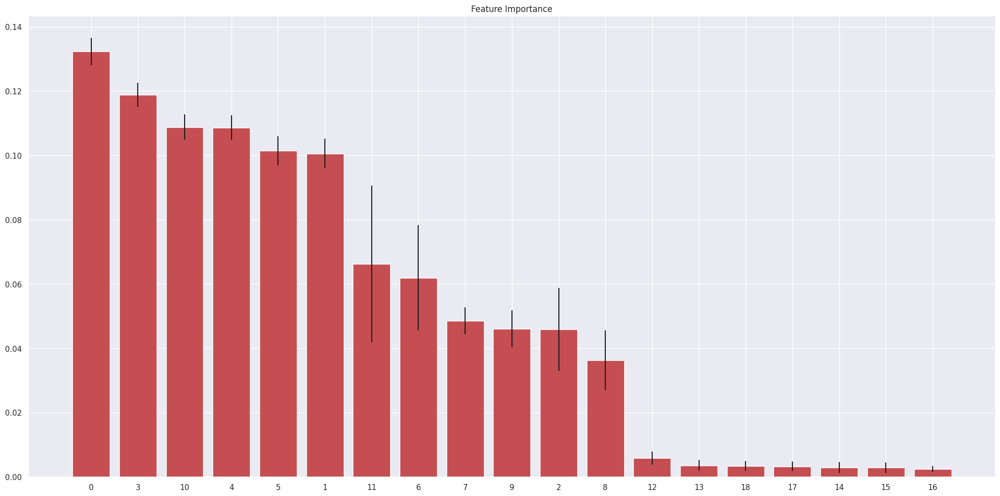

In [58]:
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis = 0)
indices = np.argsort(importances)[::-1]
df = pd.DataFrame()

for i,j in zip(x_train_feature, forest.feature_importances_):
    aux = pd.DataFrame({'feature': i, 'importance': j }, index = [0])
    df = pd.concat([df,aux], axis = 0)
print(df.sort_values('importance', ascending = False))

plt.figure()
plt.title('Feature Importance')
plt.bar(range(x_train_feature.shape[1]), importances[indices], color = 'r', yerr = std[indices], align = 'center')
plt.xticks(range(x_train_feature.shape[1]), indices)
plt.show()

# 5.3 Final Selection

* Boruta - ['util_linhas_inseguras', 'razao_debito', 'numero_vezes_passou_90_dias']
* Feature Selection - util_linhas_inseguras, razao_debito, renda_por_dependente,salario_mensal, numero_linhas_crdto_aberto, idade
* Hypothesis conclusion - Atraso pagamento,idade, salario_mensal, numero_de_dependentes

In [59]:
cols_final = ['util_linhas_inseguras','razao_debito','numero_vezes_passou_90_dias','renda_por_dependente','salario_mensal','numero_linhas_crdto_aberto','idade','atraso_pagamento','numero_de_dependentes']

# 6.0 Machine Learning

In [60]:
x_train_f = x_training[cols_final]
y_train_f = y_training.copy()
x_val = x_validation[cols_final]
y_val = y_validation.copy()

In [61]:
x_val.head()

,util_linhas_inseguras,razao_debito,numero_vezes_passou_90_dias,renda_por_dependente,salario_mensal,numero_linhas_crdto_aberto,idade,atraso_pagamento,numero_de_dependentes
47246,-0.976952,-0.976968,-0.977096,-0.569476,0.245763,1.7,-0.992673,1,0.3
48395,-0.977021,-0.976949,-0.977096,0.488777,0.488777,0.8,-1.201576,0,0.1
21303,-0.976867,-0.976691,-0.977096,-0.839670,-0.702245,0.2,-0.644501,0,0.2
79577,-0.976976,-0.977036,-0.977096,3.603756,3.603756,2.2,0.957091,0,0.1
65719,-0.976867,-0.977076,-0.977096,0.076500,0.076500,0.1,0.191112,0,0.1


# 6.1 Random Forest

In [62]:
rs1 = RandomForestClassifier(n_estimators = 500,random_state = 42, n_jobs = -1)

rs1.fit(x_train_f, y_train_f)

yhat_rs = rs1.predict(x_val)
yhat_proba = rs1.predict_proba(x_val)

In [63]:
print("Training score data: ")
print(rs1.score(x_train_f, y_train_f))

Training score data: 
1.0


<AxesSubplot: title={'center': 'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

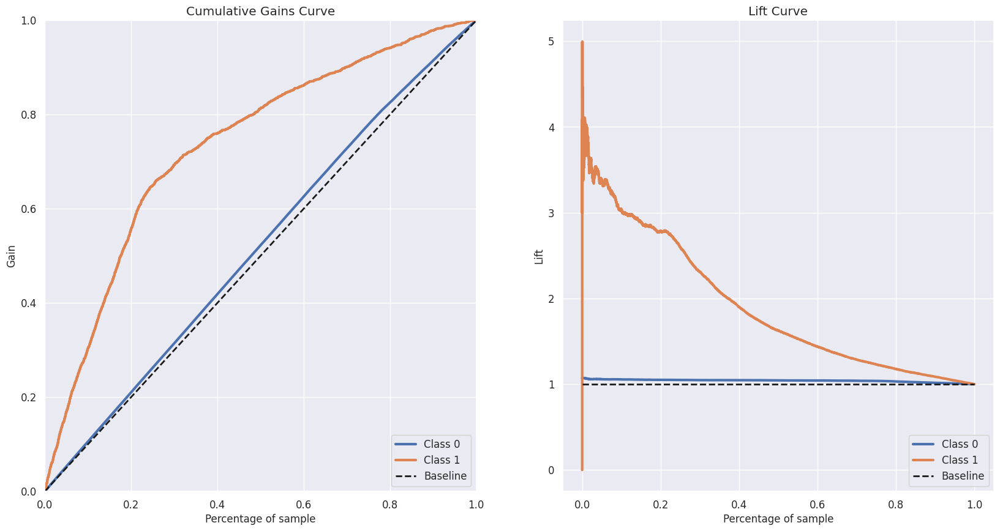

In [64]:
fig, axs = plt.subplots(ncols = 2, figsize = (20,10))
skplt.metrics.plot_cumulative_gain(y_val, yhat_proba, ax = axs[0])
skplt.metrics.plot_lift_curve(y_val, yhat_proba, ax = axs[1])

In [65]:
precision_rs = round(precision_at_k(x_val, y_val,yhat_proba,0.2),3)
recall_rs = round(recall_at_k(x_val, y_val,yhat_proba,0.2),3)
f1_rs = round(2*(precision_rs*recall_rs)/(precision_rs + recall_rs),3)

print(f'Precision é {precision_rs}')
print(f'Recall é {recall_rs}')
print(f'F1 é {f1_rs}')

Precision é 0.185
Recall é 0.555
F1 é 0.278


In [66]:
cu3 = pd.DataFrame()
cu3['response'] = yhat_proba[:,1].tolist()
cu3.sort_values('response', ascending = False)

,response
13612,0.600
12998,0.580
3341,0.576
10675,0.490
14817,0.488
2676,0.482
416,0.478
6935,0.454
16485,0.448
16737,0.434


# 6.4 XGBoost

In [67]:
xgb_model = xgb.XGBClassifier(objective='binary:logistic', eval_metric = 'error')
model_xgb = xgb_model.fit(x_train_f,y_train_f)
yhat_xgb = model_xgb.predict(x_val)
yhat_probaxgb = model_xgb.predict_proba(x_val)

In [68]:
from sklearn.metrics import recall_score
print(recall_score(y_val,yhat_xgb))

0.0


In [69]:
print("Training score data: ")
print(model_xgb.score(x_train_f, y_train_f))

Training score data: 
0.9494844692302704


<AxesSubplot: title={'center': 'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

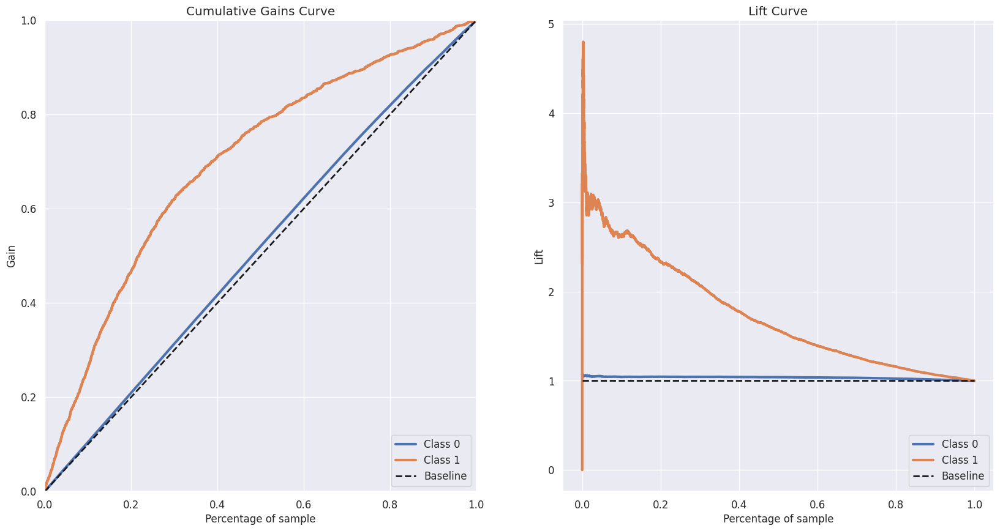

In [70]:
fig, axs = plt.subplots(ncols = 2, figsize = (20,10))
skplt.metrics.plot_cumulative_gain(y_val, yhat_probaxgb, ax = axs[0])
skplt.metrics.plot_lift_curve(y_val, yhat_probaxgb, ax = axs[1])

In [71]:
precision_xgb = round(precision_at_k(x_val, y_val,yhat_probaxgb,0.2),3)
recall_xgb = round(recall_at_k(x_val, y_val,yhat_probaxgb,0.2),3)
f1_xgb = round(2*(precision_xgb*recall_xgb)/(precision_xgb + recall_xgb),3)

print(f'Precision é {precision_xgb}')
print(f'Recall é {recall_xgb}')
print(f'F1 é {f1_xgb}')

Precision é 0.156
Recall é 0.467
F1 é 0.234


In [72]:
cu4 = pd.DataFrame()
cu4['response'] = yhat_probaxgb[:,1].tolist()
cu4.sort_values('response', ascending = False)

,response
15053,0.433637
24771,0.364806
6494,0.360390
14185,0.359009
22305,0.354350
19500,0.338466
1575,0.337654
12613,0.325775
17532,0.315682
20195,0.310783


# 6.5 Light Gradient Boosting Machine Classification

In [73]:
lgbm_model = lgb.LGBMClassifier()
model_lgbm = lgbm_model.fit(x_train_f,y_train_f)
yhat_lgbm = model_lgbm.predict_proba(x_val)

<AxesSubplot: title={'center': 'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

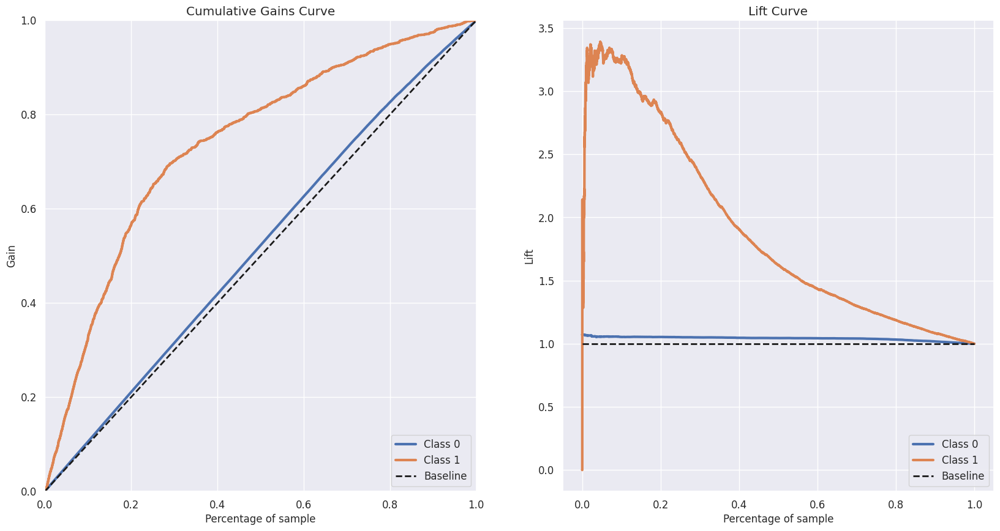

In [74]:
fig, axs = plt.subplots(ncols = 2, figsize = (20,10))
skplt.metrics.plot_cumulative_gain(y_val, yhat_lgbm, ax = axs[0])
skplt.metrics.plot_lift_curve(y_val, yhat_lgbm, ax = axs[1])

In [75]:
precision_lgbm = round(precision_at_k(x_val, y_val,yhat_lgbm,0.2),3)
recall_lgbm = round(recall_at_k(x_val, y_val,yhat_lgbm,0.2),3)
f1_lgbm = round(2*(precision_lgbm*recall_lgbm)/(precision_lgbm + recall_lgbm),3)

print(f'Precision é {precision_lgbm}')
print(f'Recall é {recall_lgbm}')
print(f'F1 é {f1_lgbm}')

Precision é 0.189
Recall é 0.565
F1 é 0.283


In [76]:
cu5 = pd.DataFrame()
cu5['response'] = yhat_lgbm[:,1].tolist()
cu5.sort_values('response', ascending = False)

,response
6513,0.401456
2436,0.393320
819,0.386449
8757,0.375211
12739,0.370223
17063,0.370223
25144,0.370223
2511,0.370223
13963,0.370223
22676,0.356722


# 7.0 Cross- Validation

In [77]:

a3 = crossvalidation(5,'Random forest',rs1,x_train_f, y_train_f)
a4 = crossvalidation(5,'XGBoost',xgb_model,x_train_f, y_train_f)
a5 = crossvalidation(5,'LGBM',lgbm_model,x_train_f, y_train_f)
cross_model = pd.concat([a3,a4,a5], axis = 0)


In [78]:
cross_model.sort_values('recall', ascending = False)

,Model,precision,recall,f1_str
0,LGBM,0.2348+/-0.0059,0.6804+/-0.0172,0.3492+/-0.0089
0,Random forest,0.2288+/-0.0047,0.6634+/-0.0134,0.3402+/-0.007
0,XGBoost,0.2276+/-0.007,0.6602+/-0.0205,0.3384+/-0.0105


# 8.0 HyperParameter Tunning

In [79]:
import random
import warnings
warnings.filterwarnings('ignore')

# 8.1 XGBoost

In [80]:
param = {
    'n_estimators':[1500,1700,2500,3000,3500],
    'eta':[0.01,0.03],
    'max_depth':[3,5,9],
    'subsample':[0.1,0.5,0.7],
    'colsample_bytree': [0.3,0.7,0.9],
    'min_child_weight': [3,8,15] 
         }

MAX_EVAL = 5

In [81]:

#final_result = pd.DataFrame()
#for i in range(MAX_EVAL):
    #hp = {k:random.sample(v,1)[0] for k,v in param.items()}
    #print(hp)
    #xgb_model = xgb.XGBClassifier(objective='binary:logistic', 
                                #n_estimators=hp['n_estimators'],
                                 #eta = hp['eta'], 
                                 #max_depth= hp['max_depth'],
                                 #subsample =hp['subsample'],
                                 #colsample_bytree =hp['colsample_bytree'] ,
                                 #min_child_weight = hp['min_child_weight'],eval_metric = 'error')
    #result = crossvalidation(5,'XGBoost',xgb_model,x_train_f,y_train_f)
    #final_result = pd.concat([final_result,result])
#final_result

In [82]:
xgb_model_final = xgb.XGBClassifier(objective='binary:logistic', 
                                n_estimators=1500,
                                 eta = 0.01, 
                                 max_depth= 9,
                                 subsample =0.1,
                                 colsample_bytree =0.7 ,
                                 min_child_weight = 3 ,eval_metric = 'error')

model_xgb_f = xgb_model_final.fit(x_train_f,y_train_f)
yhat_xgb_f = model_xgb_f.predict_proba(x_val)

# 8.2 Random forest

In [83]:
rs_param = {
    'bootstrap':[True, False],
    'max_depth':[10,20,30,40,50,60,70,80,90, None],
    'max_features':['auto','sqrt'],
    'n_jobs':[-1],
    'random_state':[42]
         }

MAX_EVAL = 5

In [84]:
#final_result_rs = pd.DataFrame()
#for i in range(MAX_EVAL):
    #hp = {k:random.sample(v,1)[0] for k,v in rs_param.items()}
    #print(hp)
    #rs = RandomForestClassifier(bootstrap=hp['bootstrap'], 
                                 #max_depth=hp['max_depth'],
                                 #max_features = hp['max_features'],
                                 #n_jobs =hp['n_jobs'],
                                 #random_state =hp['random_state'] 
                                 #)
    #result_rs = crossvalidation(5,'Random Forest',rs,x_train_f,y_train_f)
    #final_result_rs = pd.concat([final_result_rs,result_rs])
#final_result_rs

In [85]:
rs_final = RandomForestClassifier(bootstrap=False, 
                                 max_depth=90,
                                 max_features = 'sqrt',
                                 n_jobs =-1,
                                 random_state =42 
                                 )

In [86]:
model_rs_f = rs_final.fit(x_train_f,y_train_f)
yhat_rs_f = model_rs_f.predict_proba(x_val)

# 9.0 Test Dataset

In [87]:
df_test = pd.read_csv('/home/mattheus/Processo DataRISK/case_datarisk/teste.csv')
df_test.head()

,util_linhas_inseguras,idade,vezes_passou_de_30_59_dias,razao_debito,salario_mensal,numero_linhas_crdto_aberto,numero_vezes_passou_90_dias,numero_emprestimos_imobiliarios,numero_de_vezes_que_passou_60_89_dias,numero_de_dependentes
0,0.025849,62,0,0.081775,8180.0,3,0,2,0,0.0
1,0.667083,55,0,0.153112,2200.0,3,0,0,0,0.0
2,0.007093,44,0,0.148800,7499.0,20,0,1,0,0.0
3,0.091213,54,0,0.351635,5900.0,15,0,1,1,0.0
4,0.112680,54,0,0.065959,2167.0,3,0,0,0,0.0


In [88]:
df_test['idade_cat'] = df_test['idade'].apply(lambda x : 'adulto' if x < 40 else 'coroa' if x < 65 else 'idoso')

df_test['salario_mensal_cat'] = df_test['salario_mensal'].apply(lambda x: 'classe_baixa' if x <= 3000 else 'classe_media' if x<=10000 else 'classe_alta' )

df_test['renda_por_dependente'] = df_test.apply(lambda x: x['salario_mensal']/x['numero_de_dependentes'] if x['numero_de_dependentes'] != 0 else x['salario_mensal'], axis = 1)

df_test['atraso_pagamento'] = df_test.apply(lambda x: 0 if (x['vezes_passou_de_30_59_dias'] == 0) & (x['numero_vezes_passou_90_dias'] == 0) & (x['numero_de_vezes_que_passou_60_89_dias'] == 0) else 1, axis = 1)

df_test['dívidas_acima_patrimonio'] = df_test['razao_debito'].apply(lambda x: 1 if x >= 1 else 0 )

In [98]:

df_test1 = df_test.copy()
df_test1 = df_test1.dropna(subset= ['salario_mensal','numero_de_dependentes'])
df_test = df_test.dropna(subset= ['salario_mensal','numero_de_dependentes'])
print(f'Antes tinha {df_test.shape[0]} e agora tem {df_test.shape[0]}')
print(f'Antes tinha {df_test.shape[1]} e agora tem {df_test.shape[1]}')

Antes tinha 32032 e agora tem 32032
Antes tinha 9 e agora tem 9


In [90]:
df_test['idade'] = ss.transform(df_test[['idade']].values)

#util_linhas_inseguras
df_test['util_linhas_inseguras'] = rs.transform(df_test[['util_linhas_inseguras']])
#vezes_passou_de_30_59_dias
df_test['vezes_passou_de_30_59_dias'] = rs.transform(df_test[['vezes_passou_de_30_59_dias']])
#razao_debito
df_test['razao_debito'] = rs.transform(df_test[['razao_debito']])
#salario_mensal
df_test['salario_mensal'] = rs.transform(df_test[['salario_mensal']])
#numero_linhas_crdto_aberto
df_test['numero_linhas_crdto_aberto'] = mms.transform(df_test[['numero_linhas_crdto_aberto']])
#numero_vezes_passou_90_dias
df_test['numero_vezes_passou_90_dias'] = rs.transform(df_test[['numero_vezes_passou_90_dias']])
#numero_emprestimos_imobiliarios
df_test['numero_emprestimos_imobiliarios'] = rs.transform(df_test[['numero_emprestimos_imobiliarios']])
#numero_de_vezes_que_passou_60_89_dias
df_test['numero_de_vezes_que_passou_60_89_dias'] = rs.transform(df_test[['numero_de_vezes_que_passou_60_89_dias']])
#numero_de_dependentes
df_test['numero_de_dependentes'] = mms.transform(df_test[['numero_de_dependentes']])
#renda_por_dependente
df_test['renda_por_dependente'] = rs.transform(df_test[['renda_por_dependente']])

#idade_cat
df_test = pd.get_dummies(df_test,prefix = 'idade_cat', columns = ['idade_cat'])
#salario_mensal_cat
df_test = pd.get_dummies(df_test,prefix = 'salario_mensal_cat', columns = ['salario_mensal_cat'])

In [93]:
df_test= df_test[cols_final]

In [94]:
rs_tuned = RandomForestClassifier(bootstrap=False, 
                                 max_depth=90,
                                 max_features = 'sqrt',
                                 n_jobs =-1,
                                 random_state =42 
                                 )
model_tuned = rs_tuned.fit(x_train_f,y_train_f)
yhat_final_rs = model_tuned.predict_proba(df_test)

In [99]:
df_test1['score'] = yhat_final_rs[:,1].tolist()
df_test1 = df_test1.sort_values('score', ascending = False)
df_test1 = df_test1.reset_index(drop = True)
df_test1['ranking'] = df_test1.index + 1

In [100]:
df_test1.head()

,util_linhas_inseguras,razao_debito,numero_vezes_passou_90_dias,renda_por_dependente,salario_mensal,numero_linhas_crdto_aberto,idade,atraso_pagamento,numero_de_dependentes,score,ranking
0,-0.976867,-0.977096,-0.954650,-0.207513,-0.207513,0.0,-1.828286,1,0.0,0.69,1
1,-0.977094,-0.977096,-0.976867,1.954650,1.954650,0.2,1.514166,1,0.1,0.62,2
2,-0.976867,-0.977070,-0.977096,-0.513284,-0.513284,0.0,-1.897921,1,0.0,0.62,3
3,-0.976867,-0.977096,-0.954650,-0.163307,-0.163307,0.0,-1.967555,1,0.0,0.61,4
4,-0.976867,-0.977095,-0.976867,-0.175447,-0.175447,0.0,-1.619383,1,0.0,0.60,5
